In [1]:
import numpy as np
import pandas as pd
import os
import matplotlib.pyplot as plt
import shutil
import cv2
from sklearn.model_selection import train_test_split
from PIL import Image
import tensorflow as tf

In [2]:
import tensorflow as tf
tf.test.is_gpu_available(
    cuda_only=False, min_cuda_compute_capability=None
)

Instructions for updating:
Use `tf.config.list_physical_devices('GPU')` instead.


True

In [3]:
#from google.colab import drive
#drive.mount('/content/drive')

In [4]:
df = pd.read_csv('H:\\AICUP\\tag_locCoor_new.csv', encoding='Big5')
print(df)

       TARGET_FID                                       Img  target_x  \
0               0  000b43a3-d331-47ad-99a4-4c0fa9b48298.jpg         0   
1               1  00172189-3156-48d7-bb1e-f0a922bc54b8.jpg         0   
2               2  002aec7b-648e-4d1f-9463-a43c0304e774.jpg         0   
3               3  007cd63a-333c-47f2-b2e2-193f76f7c684.jpg         0   
4               4  00a326ba-7e9a-4bc1-8684-4bf404bfd6bb.jpg         0   
...           ...                                       ...       ...   
89509       89509  ffb5fc02-3d23-47de-aced-eced1a44d005.jpg         0   
89510       89510  ffd7568f-fe75-4e57-85aa-c11ec9b88776.jpg         0   
89511       89511  ffd9c5f8-e928-4779-9f60-38549c127a48.jpg         0   
89512       89512  fff0cfff-825a-4684-afd3-f345aa1df056.jpg         0   
89513       89513  fff7bac9-4872-4896-87f5-027cf94ef88e.jpg         0   

       target_y COUNTYNAME TOWNNAME      town_x     town_y     Category  \
0             0        彰化縣      二林鎮  120.404221 

## 圖片分類到對應資料夾

In [5]:
# data_path = "/content/drive/MyDrive/深度學習期末專題/HAM10000_images_part_1/"
# # data_path = "/content/drive/MyDrive/深度學習期末專題/rowdata/HAM10000_images_part_1/"
# os.path.exists(data_path)

# for img in os.listdir(data_path):
#   tmp = df[ df.iloc[:, 1] == img.split('.')[0] ]
#   # print(tmp)
#   class_name = tmp.iloc[0, 2]
#   # print(img,class_name)
#   src_path = '/content/drive/MyDrive/深度學習期末專題/HAM10000_images_part_1/' + img
#   # print(src_path)
#   tar_path = '/content/drive/MyDrive/深度學習期末專題/HAM10000/{0}/'.format(class_name)
#   # print(tar_path)
#   # print(os.path.exists(tar_path))
#   print(src_path, tar_path)
#   shutil.copy(src_path, tar_path)

In [6]:
data_path = "H:\\AICUP\\dataset_org_crop\\"
os.path.exists(data_path)

True

In [7]:
os.listdir(data_path)

['asparagus',
 'bambooshoots',
 'betel',
 'broccoli',
 'cauliflower',
 'chinesecabbage',
 'chinesechives',
 'custardapple',
 'grape',
 'greenhouse',
 'greenonion',
 'kale',
 'lemon',
 'lettuce',
 'litchi',
 'longan',
 'loofah',
 'mango',
 'onion',
 'others',
 'papaya',
 'passionfruit',
 'pear',
 'pennisetum',
 'redbeans',
 'roseapple',
 'sesbania',
 'soybeans',
 'sunhemp',
 'sweetpotato',
 'taro',
 'tea',
 'waterbamboo']

## 分成train, valid, test資料集

In [8]:
def image_preprocessing(img_path, img_size):
    img = cv2.imread(img_path)
#     h, w, _ = img.shape
#     lmax = max(h, w)
    
#     if h!=w and lmax==h:
#         err = h-w
#         img = np.concatenate([np.zeros((h, err//2, 3), dtype="uint8"), img, np.zeros((h, err-err//2, 3))], 1)
#     elif h!=w and lmax==w:
#         err = w-h
#         img = np.concatenate([np.zeros((err//2, w, 3), dtype="uint8"), img, np.zeros((err-err//2, w, 3))], 0)
    return img

In [9]:
def data_open_save(data_path, new_path, img_size=(800,800), data_split=True, data_split_rate=[0.995, 0.0025, 0.0025]):
    #先建立兩個list儲存資料路徑跟對應的label
    data_path_list, data_label_list = [], []
    
    for root, dirs, files in os.walk(data_path):
        if len(files)!=0:
            label = root.split("\\")[-1] # D:\yzheng\dataset_400\asparagus
            if data_split:
                split_names = ["train", "valid", "test"]            
                for each_name in split_names:
                    #new_root = os.path.join(new_path, each_name, label)
                    new_root=new_path+"\\"+each_name+"\\"+label
                    if not os.path.exists(new_root):
                        os.makedirs(new_root)
            else:
                #new_root = os.path.join(new_path, label)
                new_root=new_path+"\\"+label
                if not os.path.exists(new_root):
                    os.makedirs(new_root)
        
        for file in files:
            #img_path = os.path.join(root, file)
            img_path=root+"\\"+file
            label = root.split("\\")[-1]
            data_path_list.append(img_path)
            data_label_list.append(label)
            print(img_path)

    data_list = pd.DataFrame({"img_path":data_path_list, "label":data_label_list})
    class_map = { label: i for i, label in enumerate(data_list["label"].unique().copy())}
    data_list["label_class"] = data_list["label"].map(class_map)

    if data_split:
        train_list, test_list = train_test_split(data_list,
                            test_size=sum(data_split_rate[-2:]),
                            random_state=2,
                            stratify=data_list["label_class"])
        valid_list, test_list = train_test_split(test_list,
                            test_size=data_split_rate[-1]/sum(data_split_rate[-2:]),
                            random_state=2,
                            stratify=test_list["label_class"])
  
        data_types = [train_list["img_path"].values, valid_list["img_path"].values, test_list["img_path"].values]
        split_names = ["train", "valid", "test"]
    else:
        data_types = [data_path_list]
        split_names = [""]

    for each_list, each_name in zip(data_types, split_names):
        for img_path in each_list:
            label, file = img_path.split("\\")[-2:]
            #new_root = os.path.join(new_path, each_name, label)
            new_root=new_path+"\\"+each_name+"\\"+label
            #img_newpath = os.path.join(new_root, file)
            img_newpath=new_root+"\\"+file
            img = image_preprocessing(img_path, img_size)
            if not cv2.imwrite(img_newpath, img):
                raise Exception('Wrong')
            

In [10]:
new_path = "H:\\AICUP\\trainset_org_400"
img_size = (800,800)
data_open_save(data_path, new_path, img_size=(800, 800), data_split=True, data_split_rate=[0.995, 0.0025, 0.0025])

H:\AICUP\dataset_org_crop\asparagus\000b43a3-d331-47ad-99a4-4c0fa9b48298.jpg
H:\AICUP\dataset_org_crop\asparagus\00172189-3156-48d7-bb1e-f0a922bc54b8.jpg
H:\AICUP\dataset_org_crop\asparagus\002aec7b-648e-4d1f-9463-a43c0304e774.jpg
H:\AICUP\dataset_org_crop\asparagus\007cd63a-333c-47f2-b2e2-193f76f7c684.jpg
H:\AICUP\dataset_org_crop\asparagus\00a326ba-7e9a-4bc1-8684-4bf404bfd6bb.jpg
H:\AICUP\dataset_org_crop\asparagus\00b77db3-7070-4cea-8d2c-c233d059327a.jpg
H:\AICUP\dataset_org_crop\asparagus\00b8e10a-04c6-42e6-8cbe-1db2920cc157.jpg
H:\AICUP\dataset_org_crop\asparagus\00c5815c-ffc2-4f50-89ec-bc9fe9416be3.jpg
H:\AICUP\dataset_org_crop\asparagus\01057890-0919-4433-9eca-a3381546b878.jpg
H:\AICUP\dataset_org_crop\asparagus\0107c785-2b90-4f90-b83f-0cb967c5c365.jpg
H:\AICUP\dataset_org_crop\asparagus\010cb6f7-4eee-4526-8a95-1e618b391a80.jpg
H:\AICUP\dataset_org_crop\asparagus\016113ea-6c8e-442a-826f-c3fc9aa03181.jpg
H:\AICUP\dataset_org_crop\asparagus\01639db7-852e-4dec-aa03-22b8be9e0e8b.jpg

H:\AICUP\dataset_org_crop\bambooshoots\8b694871-7eec-4a6f-9b23-909a219c622e.jpg
H:\AICUP\dataset_org_crop\bambooshoots\8b7d4264-50d5-4ec0-8be1-4380dffddef7.jpg
H:\AICUP\dataset_org_crop\bambooshoots\8b7d5097-bb8f-4dbd-ac42-9964896ccc99.jpg
H:\AICUP\dataset_org_crop\bambooshoots\8b81184e-3c0b-42d6-908d-de2936fb1fed.jpg
H:\AICUP\dataset_org_crop\bambooshoots\8b82a865-3d8e-4eef-be7e-7afef4c3b079.jpg
H:\AICUP\dataset_org_crop\bambooshoots\8b8cce90-5d8e-470f-b9b5-eda63086a80b.jpg
H:\AICUP\dataset_org_crop\bambooshoots\8ba3bd9d-95f7-4efd-85f1-0d8f04fa1540.jpg
H:\AICUP\dataset_org_crop\bambooshoots\8bb290d9-ced4-4e26-80ac-192482c58fcf.jpg
H:\AICUP\dataset_org_crop\bambooshoots\8bb814d6-b18b-496d-995d-e5baf7eef9fa.jpg
H:\AICUP\dataset_org_crop\bambooshoots\8bd792e0-2690-4df9-b622-6bfd6c323377.jpg
H:\AICUP\dataset_org_crop\bambooshoots\8bf32376-c6ef-42ab-9ff9-7c5fbd0e3c52.jpg
H:\AICUP\dataset_org_crop\bambooshoots\8bf7078e-0221-427f-bd23-efa0906f4ad6.jpg
H:\AICUP\dataset_org_crop\bambooshoots\8

H:\AICUP\dataset_org_crop\betel\88d78950-4be9-4bc1-8fda-e9c1eae0e22a.jpg
H:\AICUP\dataset_org_crop\betel\88e63721-0cd2-4801-afe1-31c26955ac27.jpg
H:\AICUP\dataset_org_crop\betel\88fcb5bf-5340-4f96-9782-e163cda4dbcc.jpg
H:\AICUP\dataset_org_crop\betel\891006c2-36f1-4428-bee2-431840d4ce17.jpg
H:\AICUP\dataset_org_crop\betel\8929f8fa-94c1-49cf-9a2f-1290d4817be5.jpg
H:\AICUP\dataset_org_crop\betel\89433cd6-53f5-445e-9d75-31211e144b37.jpg
H:\AICUP\dataset_org_crop\betel\8966131d-5135-43fe-98c0-2e432c01ed11.jpg
H:\AICUP\dataset_org_crop\betel\896c01c2-a423-4261-a1cf-febf24f40996.jpg
H:\AICUP\dataset_org_crop\betel\89ccc813-3b60-408d-8ff0-c11ae01419df.jpg
H:\AICUP\dataset_org_crop\betel\89f3a4b9-f287-4a1b-934b-75b6fb059ca2.jpg
H:\AICUP\dataset_org_crop\betel\8a1af1b0-5551-4876-8b92-0c1f7bde48d6.jpg
H:\AICUP\dataset_org_crop\betel\8a223841-0309-414f-9634-68c4d4b17774.jpg
H:\AICUP\dataset_org_crop\betel\8a73b089-687e-4722-b9c0-9d7735fa7532.jpg
H:\AICUP\dataset_org_crop\betel\8acd49fc-0973-41e0-

H:\AICUP\dataset_org_crop\broccoli\af5ddc13-a3fd-4339-9708-08fbb11711b3.jpg
H:\AICUP\dataset_org_crop\broccoli\af78c441-f1d0-4f8d-bf30-ce4978d5479e.jpg
H:\AICUP\dataset_org_crop\broccoli\afad4be5-9560-46f2-b019-2a006e31c712.jpg
H:\AICUP\dataset_org_crop\broccoli\afc03f06-d1d3-4e07-b9cf-080f775c0c84.jpg
H:\AICUP\dataset_org_crop\broccoli\afdcabbb-d28e-4514-9fc5-77a45e955d51.jpg
H:\AICUP\dataset_org_crop\broccoli\afdea870-38f3-4ec2-983f-9eb3dab2f6aa.jpg
H:\AICUP\dataset_org_crop\broccoli\afe3c5dc-c271-409d-b0d3-2ab61ae30f34.jpg
H:\AICUP\dataset_org_crop\broccoli\afed05df-1961-440c-a805-a67ed29020a3.jpg
H:\AICUP\dataset_org_crop\broccoli\afedf3da-fbba-4d70-8376-4a72aa8e319b.jpg
H:\AICUP\dataset_org_crop\broccoli\b009db96-332b-455b-8008-38feee1a64aa.jpg
H:\AICUP\dataset_org_crop\broccoli\b0294856-12d5-44ee-bdbc-bec004e45ed1.jpg
H:\AICUP\dataset_org_crop\broccoli\b02ac7ba-7088-451e-bc6b-65b5c68e0dc4.jpg
H:\AICUP\dataset_org_crop\broccoli\b03976bb-8aa8-4edf-9a5e-b3e83266c72f.jpg
H:\AICUP\dat

H:\AICUP\dataset_org_crop\chinesecabbage\2282c177-9216-4931-8d1a-74f6d87d5bbe.jpg
H:\AICUP\dataset_org_crop\chinesecabbage\22a9c0c0-5ab0-4985-8eb6-dd3a7b7c7bde.jpg
H:\AICUP\dataset_org_crop\chinesecabbage\22b84c39-c883-450c-b96e-d9e0e5b43a3f.jpg
H:\AICUP\dataset_org_crop\chinesecabbage\22bc9785-6930-4fb5-a970-87636ef1f46a.jpg
H:\AICUP\dataset_org_crop\chinesecabbage\230c638b-63c9-40e2-a1f8-f8715cb401bb.jpg
H:\AICUP\dataset_org_crop\chinesecabbage\23461891-e9f1-4f6e-844b-f12dee927f01.jpg
H:\AICUP\dataset_org_crop\chinesecabbage\2390e860-4a90-4093-ada4-38490d1f8f58.jpg
H:\AICUP\dataset_org_crop\chinesecabbage\23a5ee9b-e96d-4d39-89a7-e6a82f4de459.jpg
H:\AICUP\dataset_org_crop\chinesecabbage\23ab6a1c-6896-4e47-bb4d-5a52b0e0e930.jpg
H:\AICUP\dataset_org_crop\chinesecabbage\23deb503-49c0-4523-827e-b5ef44ff1352.jpg
H:\AICUP\dataset_org_crop\chinesecabbage\2407d79f-fbcb-45f6-9b66-785c91c69759.jpg
H:\AICUP\dataset_org_crop\chinesecabbage\244be8dd-9844-4b6f-af5a-8346726e9674.jpg
H:\AICUP\dataset

H:\AICUP\dataset_org_crop\chinesechives\ef3bcc75-bd06-465b-9e09-395e4a79a964.jpg
H:\AICUP\dataset_org_crop\chinesechives\ef67ba0f-e598-4617-81c6-80d5dac55b37.jpg
H:\AICUP\dataset_org_crop\chinesechives\ef69c160-eba3-4ea4-9b1d-6987889e1569.jpg
H:\AICUP\dataset_org_crop\chinesechives\ef96e93c-8074-4838-996f-aab2fd5aba21.jpg
H:\AICUP\dataset_org_crop\chinesechives\efac5bce-c7a5-4c86-b196-60587f8931c1.jpg
H:\AICUP\dataset_org_crop\chinesechives\efebd141-7476-455f-be4c-b801d29b0737.jpg
H:\AICUP\dataset_org_crop\chinesechives\f0018a7b-1c9a-4331-8f5f-12024179ea4b.jpg
H:\AICUP\dataset_org_crop\chinesechives\f0294d03-4582-4739-9e17-873135779672.jpg
H:\AICUP\dataset_org_crop\chinesechives\f04947b7-71f1-44af-9481-372ad58dfa37.jpg
H:\AICUP\dataset_org_crop\chinesechives\f0a22bbc-958b-4ed9-b680-679d6e526a17.jpg
H:\AICUP\dataset_org_crop\chinesechives\f0a739bd-570b-47b1-965e-a269139c8523.jpg
H:\AICUP\dataset_org_crop\chinesechives\f0b8b8af-725a-4518-a7ed-f773edd85d0e.jpg
H:\AICUP\dataset_org_crop\ch

H:\AICUP\dataset_org_crop\grape\7c26df55-4767-4330-a731-187648bf709e.jpg
H:\AICUP\dataset_org_crop\grape\7c29351a-db59-44ea-a28a-4f268ba875ef.jpg
H:\AICUP\dataset_org_crop\grape\7c31175f-5946-440a-a6a4-c8fb6d9a76b4.jpg
H:\AICUP\dataset_org_crop\grape\7c47828a-853a-4fb3-b1c9-b72d043a0eb1.jpg
H:\AICUP\dataset_org_crop\grape\7c4c7e14-6f21-433b-b23e-dd9bd98557a9.jpg
H:\AICUP\dataset_org_crop\grape\7c6102f4-50bb-45ce-a2dd-2488198b8bb4.jpg
H:\AICUP\dataset_org_crop\grape\7c702a7f-285c-4983-b08a-9d4d4d35dcfc.jpg
H:\AICUP\dataset_org_crop\grape\7cc097dd-74db-45d9-8f46-5c92604194b2.jpg
H:\AICUP\dataset_org_crop\grape\7cc4cb18-b6f8-49e9-82df-b4d6462865f7.jpg
H:\AICUP\dataset_org_crop\grape\7cce8e7d-c045-40e4-9cf5-0f82ba9fb6ad.jpg
H:\AICUP\dataset_org_crop\grape\7cd5c7af-e637-41c4-bc0e-482c011226d3.jpg
H:\AICUP\dataset_org_crop\grape\7cf42cff-0230-42a2-9367-4b868217f79d.jpg
H:\AICUP\dataset_org_crop\grape\7d00150e-5937-48aa-b17a-cc30dccc325c.jpg
H:\AICUP\dataset_org_crop\grape\7d127f7c-6e2c-47eb-

H:\AICUP\dataset_org_crop\greenonion\000a824c-6ea7-457a-8953-79cfe70ea2d0.jpg
H:\AICUP\dataset_org_crop\greenonion\00137de8-4067-42e9-b176-029b44f98e12.jpg
H:\AICUP\dataset_org_crop\greenonion\00158c04-24d2-47f2-a1d5-bbf512678af5.jpg
H:\AICUP\dataset_org_crop\greenonion\001fcb51-ddeb-4e48-b612-186b7eec6730.jpg
H:\AICUP\dataset_org_crop\greenonion\0037bab7-49e5-4697-a002-e38c13c62a59.jpg
H:\AICUP\dataset_org_crop\greenonion\003ca42f-c1f3-46e4-88bd-51ac843b1b00.jpg
H:\AICUP\dataset_org_crop\greenonion\004deb2b-e23a-47db-ad4a-f9d390c387c7.jpg
H:\AICUP\dataset_org_crop\greenonion\0059a254-9f89-41ca-b351-d2b51f08cdea.jpg
H:\AICUP\dataset_org_crop\greenonion\006736ae-fa7e-4368-a512-0dbd8b8d6f0b.jpg
H:\AICUP\dataset_org_crop\greenonion\006dedfc-d5a8-497e-9323-0b18e1c4847e.jpg
H:\AICUP\dataset_org_crop\greenonion\008333fa-67b6-4be2-85ec-958ae755184b.jpg
H:\AICUP\dataset_org_crop\greenonion\00bf7fee-b0cb-4942-940b-c4a594ae60b3.jpg
H:\AICUP\dataset_org_crop\greenonion\00ed8cb0-1b91-4620-b6c6-53b

H:\AICUP\dataset_org_crop\kale\3217bce8-8d72-4b99-8dfc-41a278c81d82.jpg
H:\AICUP\dataset_org_crop\kale\32449219-fb0f-4984-a597-29e355764ea8.jpg
H:\AICUP\dataset_org_crop\kale\32482a6e-b2fa-4e49-aa79-351123d5d4a2.jpg
H:\AICUP\dataset_org_crop\kale\324ae285-683c-4216-8ace-8cb8e78454e2.jpg
H:\AICUP\dataset_org_crop\kale\326a2dea-f79a-48e7-897e-35699d491b55.jpg
H:\AICUP\dataset_org_crop\kale\326b329f-a01d-44ee-8f87-4cd04017e352.jpg
H:\AICUP\dataset_org_crop\kale\327a0cbe-c6b1-415b-b4da-3f66a3bd1d65.jpg
H:\AICUP\dataset_org_crop\kale\328c43d3-257d-4a6d-8f2d-679928c93adc.jpg
H:\AICUP\dataset_org_crop\kale\3298e632-d7fd-40d4-8fdc-62a292159ddb.jpg
H:\AICUP\dataset_org_crop\kale\333a93b7-0635-4689-b1a0-835301deec49.jpg
H:\AICUP\dataset_org_crop\kale\33528d66-715d-431e-8f1b-31c3dd2fd4b2.jpg
H:\AICUP\dataset_org_crop\kale\335ce8a4-b04d-4cb3-a301-df0d5d663bed.jpg
H:\AICUP\dataset_org_crop\kale\3375307b-f6c7-4399-b071-79160d928e23.jpg
H:\AICUP\dataset_org_crop\kale\339babd0-7cf1-4406-b80a-95b430f3b

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)




H:\AICUP\dataset_org_crop\sesbania\d10bf0ca-0c3f-4639-8054-b3bdb4366e36.jpg
H:\AICUP\dataset_org_crop\sesbania\d10e7af1-8223-47d2-9e67-c98cec0494fc.jpg
H:\AICUP\dataset_org_crop\sesbania\d115c6b0-e838-4e28-965f-ade66de73c07.jpg
H:\AICUP\dataset_org_crop\sesbania\d11c3574-95bb-46c1-bc9f-ab6c3dbda0a6.jpg
H:\AICUP\dataset_org_crop\sesbania\d12aadb7-49a6-45a3-ace1-da1819225165.jpg
H:\AICUP\dataset_org_crop\sesbania\d13e2443-7d5e-43e1-a6c7-d2f0b1ecf0df.jpg
H:\AICUP\dataset_org_crop\sesbania\d15919b4-d76e-484c-8f87-771d898d6bc1.jpg
H:\AICUP\dataset_org_crop\sesbania\d15f789d-432c-48dd-bf4c-ca972d18b6aa.jpg
H:\AICUP\dataset_org_crop\sesbania\d18a5b68-199c-4bdf-b92e-bc47198e20a3.jpg
H:\AICUP\dataset_org_crop\sesbania\d1902c6b-53f4-47a2-97ea-2adc3ad9ae0c.jpg
H:\AICUP\dataset_org_crop\sesbania\d1c4016c-930e-4ed7-924b-093538744414.jpg
H:\AICUP\dataset_org_crop\sesbania\d1cff417-af38-4136-ad3c-d8401b08cabc.jpg
H:\AICUP\dataset_org_crop\sesbania\d2079e35-174b-44f5-8326-bf7854d3eb65.jpg
H:\AICUP\da

H:\AICUP\dataset_org_crop\sunhemp\000383d7-e341-429b-8d1d-a7af40c2c741.jpg
H:\AICUP\dataset_org_crop\sunhemp\000f6c5f-950a-49c4-83cb-cb173aacbe51.jpg
H:\AICUP\dataset_org_crop\sunhemp\001cc5c2-3415-46b8-8d15-39812734c697.jpg
H:\AICUP\dataset_org_crop\sunhemp\0022f06e-8adc-4855-a490-eacd7f02180c.jpg
H:\AICUP\dataset_org_crop\sunhemp\0031c699-0703-4c3e-ae38-3e38540bad26.jpg
H:\AICUP\dataset_org_crop\sunhemp\0037493d-647b-4f11-85bc-07c527e321a7.jpg
H:\AICUP\dataset_org_crop\sunhemp\0038bc69-09fb-4f95-a69f-2405faf1c7d6.jpg
H:\AICUP\dataset_org_crop\sunhemp\003b8399-5611-4a8d-92a8-9a9816732f4f.jpg
H:\AICUP\dataset_org_crop\sunhemp\0046ec1d-4904-4c74-a64c-a625a64a7975.jpg
H:\AICUP\dataset_org_crop\sunhemp\0049f352-58e6-486d-acc5-78ce348b7260.jpg
H:\AICUP\dataset_org_crop\sunhemp\004ad389-2495-42e0-96ae-664e4eba1f2e.jpg
H:\AICUP\dataset_org_crop\sunhemp\004cf534-226f-4e41-a628-4b2c03f46df6.jpg
H:\AICUP\dataset_org_crop\sunhemp\0050e73c-5d7c-403c-bf8f-392b77c21bb4.jpg
H:\AICUP\dataset_org_crop

H:\AICUP\dataset_org_crop\sweetpotato\376b794a-2580-468f-9ed6-e1eb16a587a6.jpg
H:\AICUP\dataset_org_crop\sweetpotato\377bca47-9cde-48c5-adc2-39daadf8fef3.jpg
H:\AICUP\dataset_org_crop\sweetpotato\37ab6a7b-284f-4fcc-8d6f-737f6b5ba39c.jpg
H:\AICUP\dataset_org_crop\sweetpotato\37d8798e-9cab-4c7c-b0e8-ab124243d4c2.jpg
H:\AICUP\dataset_org_crop\sweetpotato\37d8938c-99a8-4782-ae9b-d614449b3458.jpg
H:\AICUP\dataset_org_crop\sweetpotato\37e97720-3c32-468e-aea2-83a258d6e534.jpg
H:\AICUP\dataset_org_crop\sweetpotato\37eb7d62-436a-4a13-98e7-cc133230db86.jpg
H:\AICUP\dataset_org_crop\sweetpotato\380c8ccb-28ad-4c2a-a742-cc1b063a706d.jpg
H:\AICUP\dataset_org_crop\sweetpotato\381911a4-f931-4197-a04b-179c67bd1be1.jpg
H:\AICUP\dataset_org_crop\sweetpotato\382accd8-86ef-4263-93d0-be4a289c4d43.jpg
H:\AICUP\dataset_org_crop\sweetpotato\38586ca2-cba9-4ef8-a751-d40b143334e4.jpg
H:\AICUP\dataset_org_crop\sweetpotato\386dc4b1-55ee-4df2-b4ac-603804e0f812.jpg
H:\AICUP\dataset_org_crop\sweetpotato\38894e0b-7c88-

H:\AICUP\dataset_org_crop\taro\92ca0ea9-f04c-4f9f-a4e6-9b958348ba3f.jpg
H:\AICUP\dataset_org_crop\taro\92d7da4e-21c6-40ee-a7aa-5a1615b897bf.jpg
H:\AICUP\dataset_org_crop\taro\92eb8344-d580-4387-a49b-aa364cebddcf.jpg
H:\AICUP\dataset_org_crop\taro\93128ee3-b7fb-45fb-8c83-741dd08a9848.jpg
H:\AICUP\dataset_org_crop\taro\9312fd2d-3c27-4199-a495-ba7cdb4a681a.jpg
H:\AICUP\dataset_org_crop\taro\932b7b93-5b9b-4aca-ab4a-6d56986d6356.jpg
H:\AICUP\dataset_org_crop\taro\93309647-cff6-4556-a711-c84689d767bc.jpg
H:\AICUP\dataset_org_crop\taro\93674bc6-9b7e-4d45-ac35-609612e25e48.jpg
H:\AICUP\dataset_org_crop\taro\93864923-8578-4b24-9d79-99606b32a4ad.jpg
H:\AICUP\dataset_org_crop\taro\93a62809-8351-4126-b501-e1110223540d.jpg
H:\AICUP\dataset_org_crop\taro\93bc96df-e6e1-4136-b2c3-edcea1403163.jpg
H:\AICUP\dataset_org_crop\taro\93d455c3-b4d7-4fdc-9cca-dbcbd0324bdb.jpg
H:\AICUP\dataset_org_crop\taro\9419202c-61ba-4bbe-aded-2abf3a87a0b2.jpg
H:\AICUP\dataset_org_crop\taro\941f1eac-2e05-4dc9-9adb-dadb5af4c

H:\AICUP\dataset_org_crop\tea\8f0e6222-fc93-45bd-bd46-343b364a77ae.jpg
H:\AICUP\dataset_org_crop\tea\8f218b4b-b4c6-41d2-b5e8-d99ab2bb8814.jpg
H:\AICUP\dataset_org_crop\tea\8f35524f-3ba9-422f-a478-01f50d5daf78.jpg
H:\AICUP\dataset_org_crop\tea\8f51abf4-dc3f-4656-9b94-9f4c26bcc46a.jpg
H:\AICUP\dataset_org_crop\tea\8f738ba8-e157-4d6e-9c9c-c6e26a090f9c.jpg
H:\AICUP\dataset_org_crop\tea\8f86dffd-65e6-4e5b-a1a7-2a57f95c5dc1.jpg
H:\AICUP\dataset_org_crop\tea\8f9aa483-5af9-4e47-a97b-f739ed449b8d.jpg
H:\AICUP\dataset_org_crop\tea\8fc5d9f1-5e04-4f8b-ade2-a6bfe7a39048.jpg
H:\AICUP\dataset_org_crop\tea\8fd267d0-2d7a-4da2-990a-cdfc8c4cac45.jpg
H:\AICUP\dataset_org_crop\tea\901ab503-c038-4c75-ba87-9f4df2c8d847.jpg
H:\AICUP\dataset_org_crop\tea\901bb3b9-166d-405b-8a0f-ab5f335919d8.jpg
H:\AICUP\dataset_org_crop\tea\9021c0e5-30b0-442c-b519-bca58fd9601f.jpg
H:\AICUP\dataset_org_crop\tea\902fa38d-b2c4-457f-8e99-866f9802c1f9.jpg
H:\AICUP\dataset_org_crop\tea\9033a539-f259-44cb-84bb-0676c2ed46bf.jpg
H:\AIC

H:\AICUP\dataset_org_crop\waterbamboo\f8a7a868-b2ac-4da6-b9d3-83e9440ed7a2.jpg
H:\AICUP\dataset_org_crop\waterbamboo\f8b2fafc-dd50-4b6c-96f4-d05cd198ceb8.jpg
H:\AICUP\dataset_org_crop\waterbamboo\f8b4aba9-376c-4ef2-9e05-3724d0d12dca.jpg
H:\AICUP\dataset_org_crop\waterbamboo\f8d1a263-6db1-434b-b6b3-2494c4bbbe3a.jpg
H:\AICUP\dataset_org_crop\waterbamboo\f8d6fb2b-6a3c-4686-9d75-bdd633b29d78.jpg
H:\AICUP\dataset_org_crop\waterbamboo\f8f0f1f1-181b-49c8-a7b9-def38f88a8be.jpg
H:\AICUP\dataset_org_crop\waterbamboo\f8f42593-cffc-4606-be00-75c43a724f94.jpg
H:\AICUP\dataset_org_crop\waterbamboo\f8f52f0f-ebb5-4434-a356-fe4220fd5fbc.jpg
H:\AICUP\dataset_org_crop\waterbamboo\f90ce1d8-5de6-44d6-8252-f61ed476262b.jpg
H:\AICUP\dataset_org_crop\waterbamboo\f91a8609-9980-49c6-bb0d-0e7748508669.jpg
H:\AICUP\dataset_org_crop\waterbamboo\f9520c57-6918-4f63-badb-4d1ff4b1f8cd.jpg
H:\AICUP\dataset_org_crop\waterbamboo\f95a4b10-a23b-4c75-96fc-611407ab1fb0.jpg
H:\AICUP\dataset_org_crop\waterbamboo\f95ffca4-be53-

## 訓練模型

In [24]:
data_path = "H:\\AICUP\\trainset_800"
os.path.exists(data_path)

True

In [16]:
def DataList(data_path):
  img_list, data_label, data_types = [], [], []
  class_path = ""
  for root, dirs, files in os.walk(data_path):
    if root.split("\\")[-1]!="model-logs":
      for file in files:
        if file.find("checkpoint")==-1:
          if file[-3:]=="csv":
            #class_path = os.path.join(root, file)
            class_path=root+"\\"+file
          else:
            #img_list.append(os.path.join(root, file))
            img_list.append(root+"\\"+file)
            label = root.split("\\")[-1]
            types = root.split("\\")[-2]
            data_label.append(label)
            data_types.append(types)
  data_list = pd.DataFrame({"img_path":img_list, "label_name":data_label, "types":data_types})
  
  if class_path != "":
    class_map = pd.read_csv(class_path, header=None)
    class_map = dict(class_map.values)
  else:
    class_map = data_list[data_list["types"]=="train"]["label_name"].unique()
    class_map = {label: str(i) for i, label in enumerate(class_map)}
    print(class_map)

  data_list["label"] = data_list["label_name"].map(class_map)
  
  train_list = data_list[data_list["types"]=="train"][["img_path", "label_name", "label"]].copy()
  valid_list = data_list[data_list["types"]=="valid"][["img_path", "label_name", "label"]].copy()
  test_list = data_list[data_list["types"]=="test"][["img_path", "label_name", "label"]].copy()

  return train_list, valid_list, test_list, class_map

In [17]:
train_list, valid_list, test_list, class_map = DataList(data_path)

{}


In [12]:
train_list.head()

,img_path,label_name,label
8952,D:\AICUP\trainset_400\train\asparagus\000b43a3...,asparagus,0
8953,D:\AICUP\trainset_400\train\asparagus\00172189...,asparagus,0
8954,D:\AICUP\trainset_400\train\asparagus\002aec7b...,asparagus,0
8955,D:\AICUP\trainset_400\train\asparagus\007cd63a...,asparagus,0
8956,D:\AICUP\trainset_400\train\asparagus\00a326ba...,asparagus,0


In [13]:
from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras import callbacks

In [14]:
num_classes = train_list["label"].unique().shape[0]
num_classes

33

In [15]:
img_shape = (128,128)
batch_size = 128

In [16]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator

In [17]:
from tensorflow.keras.applications.resnet50 import ResNet50, preprocess_input#<0.5
from tensorflow.keras.applications.efficientnet import EfficientNetB0,preprocess_input#<0.5
from tensorflow.keras.applications.xception import Xception,preprocess_input

In [18]:
train_datagen = ImageDataGenerator(
                    rotation_range=1.5,
                    horizontal_flip=True,
                    preprocessing_function=preprocess_input,
                    )
valid_datagen = ImageDataGenerator(preprocessing_function=preprocess_input)
test_datagen = ImageDataGenerator(preprocessing_function=preprocess_input)

In [19]:
train_generator = train_datagen.flow_from_dataframe(
                              dataframe=train_list,
                              directory="",
                              x_col="img_path",
                              y_col="label",
                              target_size=img_shape,
                              batch_size=batch_size,
                              class_mode='categorical')
valid_generator = valid_datagen.flow_from_dataframe(
                              dataframe=valid_list,
                              directory="",
                              x_col="img_path",
                              y_col="label",
                              target_size=img_shape,
                              batch_size=batch_size,
                              class_mode='categorical',
                              shuffle=False)
test_generator = test_datagen.flow_from_dataframe(
                              dataframe=test_list,
                              directory="",
                              x_col="img_path",
                              y_col="label",
                              target_size=img_shape,
                              batch_size=batch_size,
                              class_mode=None,
                              shuffle=False)

Found 71611 validated image filenames belonging to 33 classes.
Found 8951 validated image filenames belonging to 33 classes.
Found 8952 validated image filenames.


In [20]:
(data_train,label_train)= train_generator.next()
print(data_train.shape)
img=data_train[-1,:,:,:]
print(img.shape,img.max(),img.min())

(128, 128, 128, 3)
(128, 128, 3) 1.0 -0.99999076


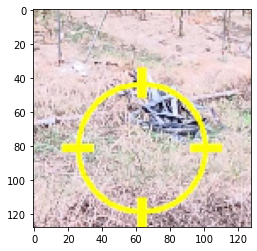

In [21]:
plt.imshow((img+1)/2)

In [ ]:
# 建立模型
import tensorflow as tf
from tensorflow.keras import datasets, layers, models,regularizers
model=models.Sequential()

model.add(layers.Conv2D(filters=32,kernel_size=(3,3),padding='same',activation='relu',kernel_regularizer=regularizers.L2(1e-4),input_shape=img.shape))
model.add(layers.Conv2D(filters=32,kernel_size=(3,3),padding='same',activation='relu',kernel_regularizer=regularizers.L2(1e-4)))
model.add(layers.BatchNormalization())
model.add(layers.MaxPooling2D())


model.add(layers.Conv2D(filters=64,kernel_size=(3,3),padding='same',activation='relu',kernel_regularizer=regularizers.L2(1e-4)))
model.add(layers.Conv2D(filters=64,kernel_size=(3,3),padding='same',activation='relu',kernel_regularizer=regularizers.L2(1e-4)))
model.add(layers.BatchNormalization())
model.add(layers.MaxPooling2D())


model.add(layers.Flatten())
model.add(layers.Dropout(0.3))
model.add(layers.Dense(units=32,activation='relu'))
model.add(layers.Dense(units=16,activation='relu'))
model.add(layers.Dense(units=2, activation='softmax'))
model.summary()

In [41]:
pre_model = Xception(weights='imagenet', input_shape=(img_shape[0], img_shape[1], 3), include_top=False)

x = layers.GlobalAveragePooling2D()(pre_model.output)
# x = layers.Dense(64, activation="relu")(x)

outputs = layers.Dense(num_classes, activation="softmax")(x)

83697664/83683744 [==============================] - 27s 0us/step


In [45]:
model = keras.models.Model(inputs=pre_model.inputs, outputs=outputs)

In [46]:
def lr_schedule(epoch):
    lrate=0.001
    if epoch>10:
        lrate=0.0005
    if epoch>20:
        lrate=0.0003
    return lrate

In [47]:
import tensorflow as tf

model_dir = os.path.join(data_path, 'model-logs')
if not os.path.exists(model_dir):
  os.makedirs(model_dir)


modelfiles = model_dir + '/{}-best-model-test000.h5'.format('basic_model')
model_mckp = callbacks.ModelCheckpoint(modelfiles,
                      monitor='val_accuracy',
                      save_best_only=True)

earlystop = callbacks.EarlyStopping(monitor='val_loss',
                    patience=3,
                    verbose=1)
reduce_lr=callbacks.ReduceLROnPlateau(monitor='val_loss',factor=0.1,
                                      patience=10,min_lr=0.001,
                                      verbose=0,mode='auto',
                                      min_delta=0.001,cooldown=0)
import datetime
logdir=os.path.join(data_path,'logs',datetime.datetime.now().strftime('%Y%m%d-%H%M%S'))
tensorboard_callback=tf.keras.callbacks.TensorBoard(logdir,
                                                    histogram_freq=1,
                                                    write_images=True,
                                                    embeddings_freq=1)

lrschedule=tf.keras.callbacks.LearningRateScheduler(lr_schedule)
callbacks_list = [model_mckp,lrschedule]

In [7]:
def num_steps_per_epoch(data_generator, batch_size):
  if data_generator.n % batch_size==0:
    return data_generator.n//batch_size
  else:
    return data_generator.n//batch_size + 1

In [49]:
lr = 1e-3
batch_size = 128
num_epochs = 20

train_steps = num_steps_per_epoch(train_generator, batch_size)
valid_steps = num_steps_per_epoch(valid_generator, batch_size)

In [50]:
optimizer = keras.optimizers.Adam(lr)
model.compile(loss="categorical_crossentropy", optimizer=optimizer, metrics=["accuracy"])

In [51]:
model.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 128, 128, 3  0           []                               
                                )]                                                                
                                                                                                  
 block1_conv1 (Conv2D)          (None, 63, 63, 32)   864         ['input_1[0][0]']                
                                                                                                  
 block1_conv1_bn (BatchNormaliz  (None, 63, 63, 32)  128         ['block1_conv1[0][0]']           
 ation)                                                                                           
                                                                                              

 n)                                                                                               
                                                                                                  
 block4_sepconv2 (SeparableConv  (None, 16, 16, 728)  536536     ['block4_sepconv2_act[0][0]']    
 2D)                                                                                              
                                                                                                  
 block4_sepconv2_bn (BatchNorma  (None, 16, 16, 728)  2912       ['block4_sepconv2[0][0]']        
 lization)                                                                                        
                                                                                                  
 conv2d_2 (Conv2D)              (None, 8, 8, 728)    186368      ['add_1[0][0]']                  
                                                                                                  
 block4_po

                                                                                                  
 block7_sepconv1_bn (BatchNorma  (None, 8, 8, 728)   2912        ['block7_sepconv1[0][0]']        
 lization)                                                                                        
                                                                                                  
 block7_sepconv2_act (Activatio  (None, 8, 8, 728)   0           ['block7_sepconv1_bn[0][0]']     
 n)                                                                                               
                                                                                                  
 block7_sepconv2 (SeparableConv  (None, 8, 8, 728)   536536      ['block7_sepconv2_act[0][0]']    
 2D)                                                                                              
                                                                                                  
 block7_se

                                                                  'add_6[0][0]']                  
                                                                                                  
 block10_sepconv1_act (Activati  (None, 8, 8, 728)   0           ['add_7[0][0]']                  
 on)                                                                                              
                                                                                                  
 block10_sepconv1 (SeparableCon  (None, 8, 8, 728)   536536      ['block10_sepconv1_act[0][0]']   
 v2D)                                                                                             
                                                                                                  
 block10_sepconv1_bn (BatchNorm  (None, 8, 8, 728)   2912        ['block10_sepconv1[0][0]']       
 alization)                                                                                       
          

 block12_sepconv3 (SeparableCon  (None, 8, 8, 728)   536536      ['block12_sepconv3_act[0][0]']   
 v2D)                                                                                             
                                                                                                  
 block12_sepconv3_bn (BatchNorm  (None, 8, 8, 728)   2912        ['block12_sepconv3[0][0]']       
 alization)                                                                                       
                                                                                                  
 add_10 (Add)                   (None, 8, 8, 728)    0           ['block12_sepconv3_bn[0][0]',    
                                                                  'add_9[0][0]']                  
                                                                                                  
 block13_sepconv1_act (Activati  (None, 8, 8, 728)   0           ['add_10[0][0]']                 
 on)      

In [52]:
pre_model.trainable = False

In [53]:
history = model.fit_generator(train_generator,
                  steps_per_epoch=train_steps,
                  epochs=num_epochs,
                  validation_data=valid_generator,
                  validation_steps=valid_steps,
                  callbacks=callbacks_list)

<ipython-input-53-3386aa43501b>:1: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  history = model.fit_generator(train_generator,


Epoch 1/20
560/560 [==============================] - 1892s 3s/step - loss: 1.9146 - accuracy: 0.4553 - val_loss: 1.8781 - val_accuracy: 0.4594 - lr: 0.0010
Epoch 2/20
560/560 [==============================] - 384s 684ms/step - loss: 1.4300 - accuracy: 0.5861 - val_loss: 1.6064 - val_accuracy: 0.5436 - lr: 0.0010
Epoch 3/20
560/560 [==============================] - 376s 670ms/step - loss: 1.2399 - accuracy: 0.6353 - val_loss: 1.6307 - val_accuracy: 0.5321 - lr: 0.0010
Epoch 4/20
560/560 [==============================] - 364s 648ms/step - loss: 1.1072 - accuracy: 0.6700 - val_loss: 1.4039 - val_accuracy: 0.6035 - lr: 0.0010
Epoch 5/20
560/560 [==============================] - 468s 834ms/step - loss: 0.9860 - accuracy: 0.7053 - val_loss: 1.5716 - val_accuracy: 0.5789 - lr: 0.0010
Epoch 6/20
560/560 [==============================] - 371s 662ms/step - loss: 0.8789 - accuracy: 0.7328 - val_loss: 1.6193 - val_accuracy: 0.5789 - lr: 0.0010
Epoch 7/20
560/560 [============================

In [55]:
pre_model.trainable = True
for each_layer in pre_model.layers[:-5]: #倒數五層
    each_layer.trainable = False

lr = 1e-5
batch_size = 64
num_epochs = 10

In [56]:
history = model.fit_generator(train_generator,
                  steps_per_epoch=train_steps,
                  epochs=num_epochs,
                  validation_data=valid_generator,
                  validation_steps=valid_steps,
                  callbacks=callbacks_list)

<ipython-input-56-3386aa43501b>:1: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  history = model.fit_generator(train_generator,


Epoch 1/10
560/560 [==============================] - 360s 641ms/step - loss: 0.3424 - accuracy: 0.8886 - val_loss: 2.2607 - val_accuracy: 0.5945 - lr: 0.0010
Epoch 2/10
560/560 [==============================] - 358s 639ms/step - loss: 0.2582 - accuracy: 0.9160 - val_loss: 2.3928 - val_accuracy: 0.5756 - lr: 0.0010
Epoch 3/10
560/560 [==============================] - 589s 1s/step - loss: 0.2085 - accuracy: 0.9308 - val_loss: 2.3730 - val_accuracy: 0.6004 - lr: 0.0010
Epoch 4/10
560/560 [==============================] - 400s 714ms/step - loss: 0.1988 - accuracy: 0.9355 - val_loss: 2.4151 - val_accuracy: 0.5787 - lr: 0.0010
Epoch 5/10
560/560 [==============================] - 380s 677ms/step - loss: 0.1754 - accuracy: 0.9423 - val_loss: 2.2289 - val_accuracy: 0.6018 - lr: 0.0010
Epoch 6/10
560/560 [==============================] - 403s 719ms/step - loss: 0.1651 - accuracy: 0.9454 - val_loss: 2.2714 - val_accuracy: 0.5957 - lr: 0.0010
Epoch 7/10
560/560 [=============================

In [2]:
from sklearn.metrics import accuracy_score, confusion_matrix

In [58]:
#model_dir=D:\AICUP\trainset_400\model-logs
model_path = model_dir + '/{}-last-model-test000.h5'.format('basic_model')
model.save(model_path)

In [3]:
import tensorflow as tf
model = tf.keras.models.load_model('D:\\AICUP\\trainset_400\\model-logs\\Xception(0.66).h5')
model.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 128, 128, 3  0           []                               
                                )]                                                                
                                                                                                  
 block1_conv1 (Conv2D)          (None, 63, 63, 32)   864         ['input_1[0][0]']                
                                                                                                  
 block1_conv1_bn (BatchNormaliz  (None, 63, 63, 32)  128         ['block1_conv1[0][0]']           
 ation)                                                                                           
                                                                                              

 block4_sepconv2_act (Activatio  (None, 16, 16, 728)  0          ['block4_sepconv1_bn[0][0]']     
 n)                                                                                               
                                                                                                  
 block4_sepconv2 (SeparableConv  (None, 16, 16, 728)  536536     ['block4_sepconv2_act[0][0]']    
 2D)                                                                                              
                                                                                                  
 block4_sepconv2_bn (BatchNorma  (None, 16, 16, 728)  2912       ['block4_sepconv2[0][0]']        
 lization)                                                                                        
                                                                                                  
 conv2d_2 (Conv2D)              (None, 8, 8, 728)    186368      ['add_1[0][0]']                  
          

 2D)                                                                                              
                                                                                                  
 block7_sepconv1_bn (BatchNorma  (None, 8, 8, 728)   2912        ['block7_sepconv1[0][0]']        
 lization)                                                                                        
                                                                                                  
 block7_sepconv2_act (Activatio  (None, 8, 8, 728)   0           ['block7_sepconv1_bn[0][0]']     
 n)                                                                                               
                                                                                                  
 block7_sepconv2 (SeparableConv  (None, 8, 8, 728)   536536      ['block7_sepconv2_act[0][0]']    
 2D)                                                                                              
          

 add_7 (Add)                    (None, 8, 8, 728)    0           ['block9_sepconv3_bn[0][0]',     
                                                                  'add_6[0][0]']                  
                                                                                                  
 block10_sepconv1_act (Activati  (None, 8, 8, 728)   0           ['add_7[0][0]']                  
 on)                                                                                              
                                                                                                  
 block10_sepconv1 (SeparableCon  (None, 8, 8, 728)   536536      ['block10_sepconv1_act[0][0]']   
 v2D)                                                                                             
                                                                                                  
 block10_sepconv1_bn (BatchNorm  (None, 8, 8, 728)   2912        ['block10_sepconv1[0][0]']       
 alization

                                                                                                  
 block12_sepconv3 (SeparableCon  (None, 8, 8, 728)   536536      ['block12_sepconv3_act[0][0]']   
 v2D)                                                                                             
                                                                                                  
 block12_sepconv3_bn (BatchNorm  (None, 8, 8, 728)   2912        ['block12_sepconv3[0][0]']       
 alization)                                                                                       
                                                                                                  
 add_10 (Add)                   (None, 8, 8, 728)    0           ['block12_sepconv3_bn[0][0]',    
                                                                  'add_9[0][0]']                  
                                                                                                  
 block13_s

In [4]:
from keras.models import model_from_json

In [22]:
batch_size = 16
test_steps = num_steps_per_epoch(test_generator, batch_size)

In [23]:
y_test = test_list["label"].values.astype(np.int_)

In [24]:
y_test

array([ 0,  0,  0, ..., 32, 32, 32])

In [ ]:
y_test_predprob = model.predict_generator(test_generator)
y_test_pred = y_test_predprob.argmax(-1)

<ipython-input-25-28c8c6aea0b5>:1: UserWarning: `Model.predict_generator` is deprecated and will be removed in a future version. Please use `Model.predict`, which supports generators.
  y_test_predprob = model.predict_generator(test_generator)


In [41]:
y_test_predprob

array([ 0,  0,  0, ..., 26, 26, 26], dtype=int64)

In [34]:
from sklearn.metrics import accuracy_score, confusion_matrix
import seaborn as sns

accuracy_score: 0.049


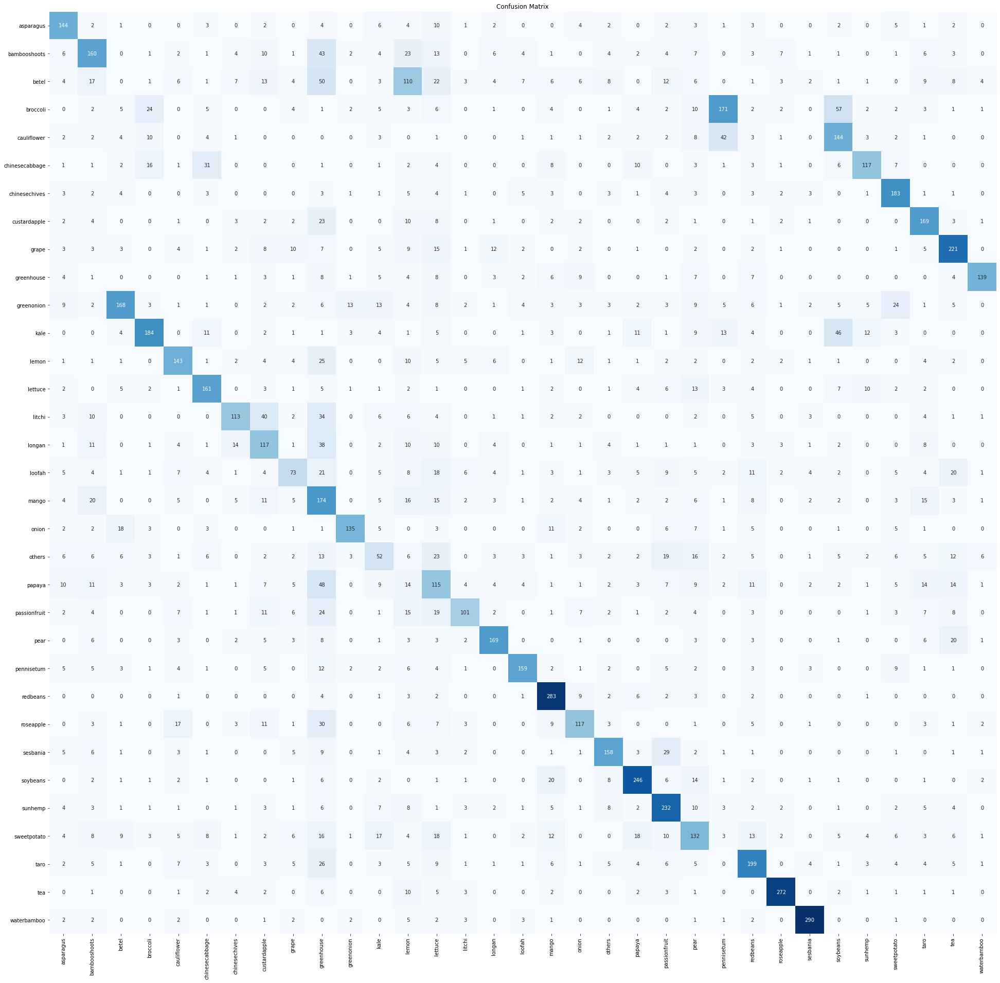

In [40]:
print(f"accuracy_score: {accuracy_score(y_test, y_test_pred):.3f}")

plt.figure(figsize=(33,33))
sns.heatmap(confusion_matrix(y_test, y_test_pred), 
      cmap="Blues", annot=True, fmt="d", cbar=False,
      xticklabels=class_map.keys(), yticklabels=class_map.keys())
plt.title("Confusion Matrix")
plt.show()

In [ ]:
import tensorflow as tf
import os
import pandas as pd
import numpy as np
import cv2
import matplotlib.pyplot as plt
from tensorflow import keras

In [ ]:
# from tensorflow.keras.applications.resnet50 import ResNet50, preprocess_input
from tensorflow.keras.applications.efficientnet import EfficientNetB0,preprocess_input
#讀取影像並縮放為模型input的大小
def show_gradcam(IMG_PATH,LAYER_NAME,CLASS_INDEX):

    img = tf.keras.preprocessing.image.load_img( IMG_PATH, target_size=(224, 224) )
    img = tf.keras.preprocessing.image.img_to_array(img)

    img = np.array([img])  # Convert single image to a batch.

    #把影像進行對應的前處理
    img = preprocess_input(img)

    grad_model = tf.keras.models.Model([model.inputs], [model.get_layer(LAYER_NAME).output, model.output])

    with tf.GradientTape() as tape:
        conv_outputs, predictions = grad_model(img)
        loss = predictions[:, CLASS_INDEX]

    output = conv_outputs[0]
    grads = tape.gradient(loss, conv_outputs)[0]

    gate_f = tf.cast(output > 0, 'float32')
    gate_r = tf.cast(grads > 0, 'float32')
    guided_grads = tf.cast(output > 0, 'float32') * tf.cast(grads > 0, 'float32') * grads

    weights = tf.reduce_mean(guided_grads, axis=(0, 1))

    cam = np.ones(output.shape[0: 2], dtype = np.float32)

    for i, w in enumerate(weights):
        cam += w * output[:, :, i]

    cam = cv2.resize(cam.numpy(), (224, 224))
    cam = np.maximum(cam, 0)
    heatmap = (cam - cam.min()) / (cam.max() - cam.min())

    cam = cv2.applyColorMap(np.uint8(255*heatmap), cv2.COLORMAP_JET)

    output_image = cv2.addWeighted(cv2.cvtColor(img[0].astype('uint8'), cv2.COLOR_RGB2BGR), 0.5, cam, 1, 0)

    #cv2.imwrite('cam.png', output_image)

    output_image = cv2.cvtColor(output_image, cv2.COLOR_BGR2RGB)
    return plt.imshow(output_image)

In [ ]:
def predict_one(img_size,img_path,model_path):
    # load model
    model = keras.models.load_model(model_path)

    # preprocess image
    image = tf.keras.preprocessing.image.load_img( img_path, target_size=(img_size, img_size))
    input_arr = keras.preprocessing.image.img_to_array(image)
    input_arr = preprocess_input( np.array([input_arr]) ) # Convert single image to a batch.

    # predict on image
    predictions = model.predict(input_arr)
    return predictions.argmax()

In [ ]:
def show_result(img_size,img_path,model_path,LAYER_NAME,CLASS_INDEX):
    result=predict_one(img_size,img_path,model_path)
    print(CLASS_INDEX,'--->',result)
    show_gradcam(img_path,LAYER_NAME,CLASS_INDEX)

In [ ]:
# akiec wrong
img_size = 224
img_path = "/content/drive/MyDrive/深度學習期末專題/HAM10000/akiec/ISIC_0024329.jpg"
model_path = '/content/drive/MyDrive/深度學習期末專題/dataset/model-logs/EfficientNetB0(0.822).h5'
LAYER_NAME = 'top_conv' 
CLASS_INDEX = 0
show_result(img_size,img_path,model_path,LAYER_NAME,CLASS_INDEX)

In [ ]:
# akiec right
img_size = 224
img_path = "/content/drive/MyDrive/深度學習期末專題/HAM10000/akiec/ISIC_0024470.jpg"
model_path = '/content/drive/MyDrive/深度學習期末專題/dataset/model-logs/EfficientNetB0(0.822).h5'
LAYER_NAME = 'top_conv' 
CLASS_INDEX = 0
show_result(img_size,img_path,model_path,LAYER_NAME,CLASS_INDEX)

In [ ]:
# mel right
img_size = 224
img_path = "/content/drive/MyDrive/深度學習期末專題/HAM10000/mel/ISIC_0024481.jpg"
model_path = '/content/drive/MyDrive/深度學習期末專題/dataset/model-logs/EfficientNetB0(0.822).h5'
LAYER_NAME = 'top_conv' 
CLASS_INDEX = 1
show_result(img_size,img_path,model_path,LAYER_NAME,CLASS_INDEX)

In [ ]:
# mel wrong
img_size = 224
img_path = "/content/drive/MyDrive/深度學習期末專題/HAM10000/mel/ISIC_0024900.jpg"
model_path = '/content/drive/MyDrive/深度學習期末專題/dataset/model-logs/EfficientNetB0(0.822).h5'
LAYER_NAME = 'top_conv' 
CLASS_INDEX = 1
show_result(img_size,img_path,model_path,LAYER_NAME,CLASS_INDEX)

In [ ]:
# df right
img_size = 224
img_path = "/content/drive/MyDrive/深度學習期末專題/HAM10000/df/ISIC_0024318.jpg"
model_path = '/content/drive/MyDrive/深度學習期末專題/dataset/model-logs/EfficientNetB0(0.822).h5'
LAYER_NAME = 'top_conv' 
CLASS_INDEX = 2
show_result(img_size,img_path,model_path,LAYER_NAME,CLASS_INDEX)

In [ ]:
# df wrong
img_size = 224
img_path = "/content/drive/MyDrive/深度學習期末專題/HAM10000/df/ISIC_0029052.jpg"
model_path = '/content/drive/MyDrive/深度學習期末專題/dataset/model-logs/EfficientNetB0(0.822).h5'
LAYER_NAME = 'top_conv' 
CLASS_INDEX = 2
show_result(img_size,img_path,model_path,LAYER_NAME,CLASS_INDEX)

In [ ]:
# nv right
img_size = 224
img_path = "/content/drive/MyDrive/深度學習期末專題/HAM10000/nv/ISIC_0024306.jpg"
model_path = '/content/drive/MyDrive/深度學習期末專題/dataset/model-logs/EfficientNetB0(0.822).h5'
LAYER_NAME = 'top_conv' 
CLASS_INDEX = 3
show_result(img_size,img_path,model_path,LAYER_NAME,CLASS_INDEX)

In [ ]:
# nv wrong
img_size = 224
img_path = "/content/drive/MyDrive/深度學習期末專題/HAM10000/nv/ISIC_0024378.jpg"
model_path = '/content/drive/MyDrive/深度學習期末專題/dataset/model-logs/EfficientNetB0(0.822).h5'
LAYER_NAME = 'top_conv' 
CLASS_INDEX = 3
show_result(img_size,img_path,model_path,LAYER_NAME,CLASS_INDEX)

In [ ]:
# bcc right
img_size = 224
img_path = "/content/drive/MyDrive/深度學習期末專題/HAM10000/bcc/ISIC_0024360.jpg"
model_path = '/content/drive/MyDrive/深度學習期末專題/dataset/model-logs/EfficientNetB0(0.822).h5'
LAYER_NAME = 'top_conv' 
CLASS_INDEX = 4
show_result(img_size,img_path,model_path,LAYER_NAME,CLASS_INDEX)

In [ ]:
# bcc wrong
img_size = 224
img_path = "/content/drive/MyDrive/深度學習期末專題/HAM10000/bcc/ISIC_0025691.jpg"
model_path = '/content/drive/MyDrive/深度學習期末專題/dataset/model-logs/EfficientNetB0(0.822).h5'
LAYER_NAME = 'top_conv' 
CLASS_INDEX = 4
show_result(img_size,img_path,model_path,LAYER_NAME,CLASS_INDEX)

In [ ]:
# vasc right
img_size = 224
img_path = "/content/drive/MyDrive/深度學習期末專題/HAM10000/vasc/ISIC_0024402.jpg"
model_path = '/content/drive/MyDrive/深度學習期末專題/dataset/model-logs/EfficientNetB0(0.822).h5'
LAYER_NAME = 'top_conv' 
CLASS_INDEX = 5
show_result(img_size,img_path,model_path,LAYER_NAME,CLASS_INDEX)

In [ ]:
# vasc wrong
img_size = 224
img_path = "/content/drive/MyDrive/深度學習期末專題/HAM10000/vasc/ISIC_0027159.jpg"
model_path = '/content/drive/MyDrive/深度學習期末專題/dataset/model-logs/EfficientNetB0(0.822).h5'
LAYER_NAME = 'top_conv' 
CLASS_INDEX = 5
show_result(img_size,img_path,model_path,LAYER_NAME,CLASS_INDEX)

In [ ]:
# bkl right
img_size = 224
img_path = "/content/drive/MyDrive/深度學習期末專題/HAM10000/bkl/ISIC_0024358.jpg"
model_path = '/content/drive/MyDrive/深度學習期末專題/dataset/model-logs/EfficientNetB0(0.822).h5'
LAYER_NAME = 'top_conv' 
CLASS_INDEX = 6
show_result(img_size,img_path,model_path,LAYER_NAME,CLASS_INDEX)

In [ ]:
# bkl wrong
img_size = 224
img_path = "/content/drive/MyDrive/深度學習期末專題/HAM10000/bkl/ISIC_0025276.jpg"
model_path = '/content/drive/MyDrive/深度學習期末專題/dataset/model-logs/EfficientNetB0(0.822).h5'
LAYER_NAME = 'top_conv' 
CLASS_INDEX = 6
show_result(img_size,img_path,model_path,LAYER_NAME,CLASS_INDEX)

In [ ]:
% load_ext tensorboard
%tensorboard --logdir /content/drive/MyDrive/深度學習期末專題/dataset/logs